<a href="https://colab.research.google.com/github/unidari/ml/blob/main/ml_12_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Практическая работа №4. Работа с векторными данными в GeoPandas**

Выполняя практическую работу, опирайтесь на теоритический материал, рассматриваемый на занятии:

- Использование NumPy, Pandas и GeoPandas для работы с пространственными данными: https://u.to/rk86Ig
- Ультимативный обзор аналитических инструментов GeoPandas:  https://u.to/s0d3Ig
- Теоретические аспекты и практические примеры получения векторных данных из OpenStreetMap: https://u.to/9SdwIQ

Дополнительно:

- Особенности построения интерактивных карт с помощью библиотеки Leafmap: https://u.to/WvA3Ig

Официальная техническая документацию по используемым библиотекам:

- **NumPy**: https://numpy.org/doc/stable/
- **Pandas**: https://pandas.pydata.org/docs/
- **GeoPandas**: https://geopandas.org/en/stable/docs.html
- **Leafmap**: https://leafmap.org/

In [41]:
%%capture
!pip install geopandas leafmap mapclassify # Устанавливаем библиотеку GeoPandas и необходимые зависимости

## **Задание №1. Операции с массивами NumPy и геопространственными координатами**


1. Создайте двумерный массив NumPy, содержащий широту и долготу следующих городов: Токио (35.6895, 139.6917), Нью-Йорк (40.7128, -74.0060), Лондон (51.5074, -0.1278) и Париж (48.8566, 2.3522).


In [42]:
import numpy as np

coordinates = np.array([
    [35.6895, 139.6917], # Токио
    [40.7128, -74.0060], # Нью-Йорк
    [51.5074, -0.1278],  # Лондон
    [48.8566, 2.3522]    # Париж
])

print(coordinates)
print(coordinates.shape)

[[ 3.568950e+01  1.396917e+02]
 [ 4.071280e+01 -7.400600e+01]
 [ 5.150740e+01 -1.278000e-01]
 [ 4.885660e+01  2.352200e+00]]
(4, 2)


2. Преобразуйте значения широты и долготы из градусов в радианы с помощью функции np.radians().


In [43]:
coords_rad = np.radians(coordinates)
print(coords_rad)

[[ 6.22899283e-01  2.43808010e+00]
 [ 7.10572408e-01 -1.29164837e+00]
 [ 8.98973719e-01 -2.23053078e-03]
 [ 8.52708531e-01  4.10536347e-02]]




3. Рассчитайте поэлементную разницу между координатами Токио и других городов в радианах.

In [44]:
for inx, i in enumerate(coords_rad):
  if inx != 0:
    print(f"{i - coords_rad[0]} - {inx}")

[ 0.08767312 -3.72972847] - 1
[ 0.27607444 -2.44031063] - 2
[ 0.22980925 -2.39702647] - 3


## **Задание 2. Операции с DataFrame Pandas и геопространственными данными**


1. Загрузите набор данных о городах мира по следующему URL с помощью Pandas: https://github.com/opengeos/datasets/releases/download/world/world_cities.csv


In [45]:
import pandas as pd
# Pandas поддерживает загрузку данных по прямым ссылкам из сети Интернет
url = "https://github.com/opengeos/datasets/releases/download/world/world_cities.csv"

df = pd.read_csv(url)

In [46]:
df.head()

,id,name,country,latitude,longitude,population
0,1,Bombo,UGA,0.5833,32.5333,75000
1,2,Fort Portal,UGA,0.6710,30.2750,42670
2,3,Potenza,ITA,40.6420,15.7990,69060
3,4,Campobasso,ITA,41.5630,14.6560,50762
4,5,Aosta,ITA,45.7370,7.3150,34062


2. Отобразите первые 5 строк и проверьте наличие отсутствующих значений.


In [47]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1249 entries, 0 to 1248
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   id          1249 non-null   int64  
 1   name        1249 non-null   object 
 2   country     1249 non-null   object 
 3   latitude    1249 non-null   float64
 4   longitude   1249 non-null   float64
 5   population  1249 non-null   int64  
dtypes: float64(2), int64(2), object(2)
memory usage: 58.7+ KB


In [48]:
df.isnull().sum()

,0
id,0
name,0
country,0
latitude,0
longitude,0
population,0


3. Отфильтруйте набор данных, чтобы включить только города с населением более 1 миллиона человек.


In [49]:
df = df[df['population'] > 1000000]

df.head()

,id,name,country,latitude,longitude,population
97,98,Turin,ITA,45.07039,7.66996,1652000
103,104,Lille,FRA,50.64997,3.08001,1044000
123,124,San Bernardino,USA,34.12038,-117.30003,1745000
124,125,Bridgeport,USA,41.17998,-73.19996,1018000
126,127,Manchester,GBR,53.50042,-2.24799,2230000


4. Сгруппируйте города по странам и рассчитайте общую численность населения для каждой страны.


In [50]:
df.groupby('country')['population'].sum().head()

,population
country,
AFG,3277000
AGO,6272900
ARE,1379000
ARG,15450000
ARM,1102000




5. Отсортируйте города по населению в порядке убывания и отобразите первые 10 городов.

In [51]:
df.sort_values('population', ascending=False).head(10)

,id,name,country,latitude,longitude,population
1239,1240,Tokyo,JPN,35.68502,139.75141,35676000
1224,1225,New York,USA,40.74998,-73.98002,19040000
1230,1231,Mexico City,MEX,19.44244,-99.13099,19028000
1240,1241,Mumbai,IND,19.01699,72.85699,18978000
1245,1246,Sao Paulo,BRA,-23.55868,-46.62502,18845000
1148,1149,Delhi,IND,28.66999,77.23000,15926000
1238,1239,Shanghai,CHN,31.21645,121.43650,14987000
1243,1244,Kolkata,IND,22.49497,88.32468,14787000
1175,1176,Dhaka,BGD,23.72306,90.40858,12797394
1217,1218,Buenos Aires,ARG,-34.60250,-58.39753,12795000


## **Задание №3. Создание и обработка GeoDataFrames с помощью GeoPandas**


1. Загрузите набор данных о зданиях Нью-Йорка из файла GeoJSON с помощью GeoPandas: https://github.com/opengeos/datasets/releases/download/places/nyc_buildings.geojson

In [52]:
import geopandas as gpd

url = "https://github.com/opengeos/datasets/releases/download/places/nyc_buildings.geojson"
buildings_gdf = gpd.read_file(url)

buildings_gdf.head()

,fid,height_MS,height_FM,height_avg,SQMETERS,STATEFP,NAME,geometry
0,2,15.05,23.30,19.18,6365.72,36,New York,"POLYGON ((-74.00129 40.71992, -74.00061 40.719..."
1,4,23.62,46.18,34.90,3287.84,36,New York,"POLYGON ((-74.0032 40.71654, -74.00265 40.7163..."
2,5,19.98,109.60,64.79,2011.21,36,New York,"POLYGON ((-74.01415 40.70324, -74.01342 40.703..."
3,9,18.50,18.18,18.34,3110.32,36,New York,"POLYGON ((-73.98974 40.71924, -73.98924 40.720..."
4,34,21.53,32.84,27.18,5240.89,36,New York,"POLYGON ((-74.00941 40.72351, -74.00816 40.723..."


2. Создайте график контуров зданий и раскрасьте их в зависимости от высоты здания (используйте столбец `height_MS`).


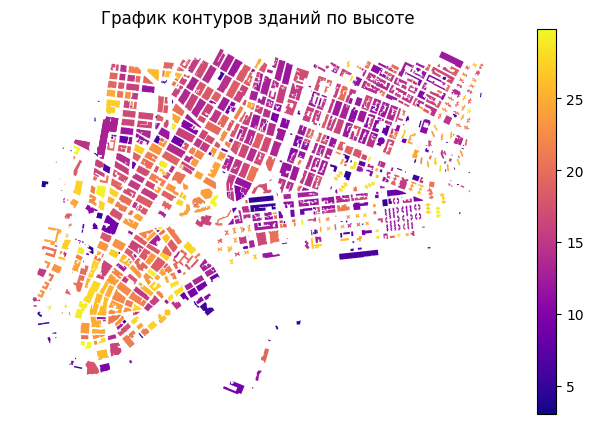

In [53]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 1, figsize=(8, 5))

buildings_gdf.plot(column='height_MS',
                   ax=ax,
                   cmap='plasma',
                   legend=True)

ax.set_title('График контуров зданий по высоте')

ax.set_axis_off()

plt.show()

3. Создайте интерактивную карту контуров зданий и раскрасьте их в зависимости от высоты здания (используйте столбец `height_MS`).


In [54]:
import leafmap

In [55]:
m = leafmap.Map(
    center=(40.7064, -74.0075),
    zoom=15,
    basemap='CartoDB.Positron',
)

m.add_data(
    buildings_gdf,
    column="height_MS",
    cmap="plasma",
    scheme="EqualInterval",
    legend_title="Высота зданий в метрах",
    layer_name="Высоты зданий",
)

m

Map(center=[40.7064, -74.0075], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'z…

In [56]:
buildings_gdf.explore(column="height_MS", cmap="plasma")

4. Рассчитайте среднюю высоту зданий (используйте столбец `height_MS`).


In [67]:
mean_MS = buildings_gdf['height_MS'].mean()
print(mean_MS)

15.454691136974038


5. Выберите здания с высотой, превышающей среднюю высоту.


In [70]:
buildings_high = buildings_gdf[buildings_gdf['height_MS'] > mean_MS]

buildings_high.head(10)

,fid,height_MS,height_FM,height_avg,SQMETERS,STATEFP,NAME,geometry
1,4,23.62,46.18,34.90,3287.84,36,New York,"POLYGON ((-74.0032 40.71654, -74.00265 40.7163..."
2,5,19.98,109.60,64.79,2011.21,36,New York,"POLYGON ((-74.01415 40.70324, -74.01342 40.703..."
3,9,18.50,18.18,18.34,3110.32,36,New York,"POLYGON ((-73.98974 40.71924, -73.98924 40.720..."
4,34,21.53,32.84,27.18,5240.89,36,New York,"POLYGON ((-74.00941 40.72351, -74.00816 40.723..."
5,38,18.84,NaN,18.84,1151.88,36,New York,"POLYGON ((-74.01574 40.70672, -74.01537 40.706..."
6,42,20.90,18.81,19.86,1836.32,36,New York,"POLYGON ((-74.01684 40.70809, -74.01731 40.708..."
7,58,28.32,66.74,47.53,2720.48,36,New York,"POLYGON ((-74.00526 40.70742, -74.00505 40.707..."
8,59,18.04,24.69,21.36,844.67,36,New York,"POLYGON ((-74.00592 40.70871, -74.00576 40.708..."
9,66,18.42,32.14,25.28,2309.56,36,New York,"POLYGON ((-74.0036 40.71757, -74.00329 40.7179..."
13,99,18.09,69.79,43.94,1884.41,36,New York,"POLYGON ((-74.01564 40.71247, -74.01566 40.712..."





6. Сохраните GeoDataFrame в новый файл GeoJSON.

In [71]:
buildings_gdf.to_file('buildings_gdf.geojson', driver='GeoJSON')
buildings_high.to_file('buildings_high.geojson', driver='GeoJSON')

## **Задание №4. Применение NumPy, Pandas и GeoPandas для обработки и анализа пространственных данных**


1. Используйте Pandas для загрузки набора данных о городах мира по следующему URL: https://github.com/opengeos/datasets/releases/download/world/world_cities.csv


In [72]:
import pandas as pd

url = "https://github.com/opengeos/datasets/releases/download/world/world_cities.csv"

cities = pd.read_csv(url)

cities.head()

,id,name,country,latitude,longitude,population
0,1,Bombo,UGA,0.5833,32.5333,75000
1,2,Fort Portal,UGA,0.6710,30.2750,42670
2,3,Potenza,ITA,40.6420,15.7990,69060
3,4,Campobasso,ITA,41.5630,14.6560,50762
4,5,Aosta,ITA,45.7370,7.3150,34062


2. Отфильтруйте набор данных, чтобы включить только города с широтой между -40 и 60 (т.е. города, расположенные в Северном полушарии или вблизи экватора).


In [74]:
cities = cities[(cities['latitude'] >= -40) & (cities['latitude'] <= 60)]

cities.head()

,id,name,country,latitude,longitude,population
0,1,Bombo,UGA,0.5833,32.5333,75000
1,2,Fort Portal,UGA,0.6710,30.2750,42670
2,3,Potenza,ITA,40.6420,15.7990,69060
3,4,Campobasso,ITA,41.5630,14.6560,50762
4,5,Aosta,ITA,45.7370,7.3150,34062


3. Создайте GeoDataFrame из отфильтрованного набора данных, преобразовав широту и долготу в геометрии.


In [79]:
gdf = gpd.GeoDataFrame(
    cities,
    geometry=gpd.points_from_xy(
        cities['longitude'],
          cities['latitude'], crs="EPSG:4326"
          )
        )

gdf.head()

,id,name,country,latitude,longitude,population,geometry
0,1,Bombo,UGA,0.5833,32.5333,75000,POINT (32.5333 0.5833)
1,2,Fort Portal,UGA,0.6710,30.2750,42670,POINT (30.275 0.671)
2,3,Potenza,ITA,40.6420,15.7990,69060,POINT (15.799 40.642)
3,4,Campobasso,ITA,41.5630,14.6560,50762,POINT (14.656 41.563)
4,5,Aosta,ITA,45.7370,7.3150,34062,POINT (7.315 45.737)


4. Перепроецируйте GeoDataFrame в проекцию Меркатора (EPSG:3857).


In [81]:
gdf = gdf.to_crs("EPSG:3857")

gdf.head()

,id,name,country,latitude,longitude,population,geometry
0,1,Bombo,UGA,0.5833,32.5333,75000,POINT (3621590.39 64933.781)
1,2,Fort Portal,UGA,0.6710,30.2750,42670,POINT (3370197.584 74697.086)
2,3,Potenza,ITA,40.6420,15.7990,69060,POINT (1758736.635 4959679.293)
3,4,Campobasso,ITA,41.5630,14.6560,50762,POINT (1631498.457 5095742.084)
4,5,Aosta,ITA,45.7370,7.3150,34062,POINT (814302.075 5738302.989)


5. Рассчитайте расстояние (в метрах) между каждым городом и Парижем.


In [86]:
gdf_indexed = gdf.set_index('name')
paris = gdf_indexed.loc['Paris', 'geometry']

gdf['distance_to_Paris'] = gdf['geometry'].distance(paris)

gdf.head()

,id,name,country,latitude,longitude,population,geometry,distance_to_Paris
0,1,Bombo,UGA,0.5833,32.5333,75000,POINT (3621590.39 64933.781),7.041672e+06
1,2,Fort Portal,UGA,0.6710,30.2750,42670,POINT (3370197.584 74697.086),6.916454e+06
2,3,Potenza,ITA,40.6420,15.7990,69060,POINT (1758736.635 4959679.293),1.979335e+06
3,4,Campobasso,ITA,41.5630,14.6560,50762,POINT (1631498.457 5095742.084),1.794231e+06
4,5,Aosta,ITA,45.7370,7.3150,34062,POINT (814302.075 5738302.989),7.561058e+05




6. Отобразите города на карте мира, раскрасив точки в зависимости от их расстояния до Парижа.



> 💡 **Подсказка:** Вы можете использовать интерактивную карту `leafmap.Map()` и метод m.add_data(), передав в него ваш GeoDataFrame (предварительно возвращенный в систему координат EPSG:4326).

Основные параметры данного метода:


* column — столбец с рассчитанным расстоянием до Парижа (предварительно разделите значение расстояния на 1000, чтобы легенда отображалась в километрах).
* cmap — цветовая палитра (например, "plasma", "viridis" или "YlOrRd").
* k — количество цветовых интервалов (рекомендуется 10–15 для плавности).
* scheme — алгоритм классификации данных:
  * "Quantiles" (Квантили) — делит города на группы с равным количеством точек в каждой. Это создаст максимальный цветовой контраст: даже если города расположены кучно, вы увидите разницу между ними.
   * "EqualInterval" (Равные интервалы) — делит весь диапазон расстояний на равные отрезки в километрах (например, 0-1000 км, 1000-2000 км и т.д.). Это нагляднее показывает реальный масштаб удаленности.



* установите параметр add_legend=True, чтобы на карте появилась шкала соответствия цветов и расстояний.

In [87]:
import leafmap

In [89]:
gdf['distance_to_Paris_km'] = gdf['distance_to_Paris']/1000
gdf = gdf.to_crs("EPSG:4326")

m2 = leafmap.Map(
    zoom=5,
    basemap='CartoDB.Positron',
)

m2.add_data(
    gdf,
    column="distance_to_Paris",
    k=13,
    cmap="plasma",
    scheme="EqualInterval",
    add_legend=True
)

m2

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…